<a href="https://colab.research.google.com/github/MatthewMoor/SOM-2.5PM/blob/master/SOMv9_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import somoclu
import math as mt
%matplotlib inline

In [2]:
union = pd.read_csv('Union.csv')

In [3]:
# print(union)
print(union.describe())

                 day           hour           DEWP           HUMI  \
count  100684.000000  100684.000000  100684.000000  100684.000000   
mean      180.404513      11.584045       8.924592      66.164877   
std       106.233458       6.887274      12.245310      22.232499   
min         0.000000       0.000000     -40.000000       2.000000   
25%        87.000000       6.000000       1.800000      51.162500   
50%       175.000000      12.000000      11.600000      70.000000   
75%       272.000000      18.000000      19.000000      84.000000   
max       364.000000      23.000000      28.000000     100.000000   

                PRES           TEMP            Iws  precipitation  \
count  100684.000000  100684.000000  100684.000000  100684.000000   
mean     1013.616711      16.234547      20.837997       0.124558   
std         9.762647      10.642250      44.194836       1.170662   
min       975.000000     -25.000000       0.000000       0.000000   
25%      1006.000000       9.0000

In [4]:
# Here we`ve change first 10
import random as rd
each_two_hundred = 0
for i in range(union.shape[0]):
    each_two_hundred += 1
    if each_two_hundred == 200:  
        union["Iws"][i] = float(rd.randrange(750, 900))
        each_two_hundred = 0
print(union.head(201))

/home/valyay/.local/lib/python3.5/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


     day  hour  DEWP  HUMI    PRES  TEMP     Iws  precipitation  Iprec  \
0     64     8  -6.0  59.0  1019.0   1.0    0.89            0.0    0.0   
1     64     9  -8.0  38.0  1019.0   5.0    1.78            0.0    0.0   
2     64    10  -8.0  31.0  1018.0   8.0    2.67            0.0    0.0   
3     64    12  -9.0  23.0  1017.0  11.0    4.45            0.0    0.0   
4     64    13  -9.0  22.0  1015.0  12.0    5.34            0.0    0.0   
5     64    14 -10.0  19.0  1014.0  13.0    7.13            0.0    0.0   
6     64    15  -9.0  19.0  1013.0  14.0    3.13            0.0    0.0   
7     64    16  -9.0  19.0  1013.0  14.0    4.92            0.0    0.0   
8     64    17  -8.0  23.0  1013.0  12.0    1.79            0.0    0.0   
9     64    18  -7.0  33.0  1013.0   8.0    0.45            0.0    0.0   
10    64    19  -6.0  44.0  1014.0   5.0    1.34            0.0    0.0   
11    64    20  -7.0  38.0  1014.0   6.0    2.23            0.0    0.0   
12    64    21  -6.0  48.0  1014.0   4

In [5]:
union.to_csv('union_anomaly_Iws.csv')

In [6]:
def data_transformation(data=None, default_data = True): 
  """Transform data in the range 0, 1"""
  if data is None and default_data == True:
    X = pd.read_csv('dust_calculation.csv')
    X = X.iloc[:, 1:]
  else:
    X = data

  from sklearn.preprocessing import MinMaxScaler
  sc = MinMaxScaler(feature_range = (0, 1))
  X = sc.fit_transform(X)
  print(np.shape(X))
  return X

def elbow_plot(X):
  """Draws plot with which we find the cluster"""
  Sum_of_squared_distances = []
  K = range(1,10)
  for k in K:
      km = KMeans(n_clusters=k).fit(X)
      km = km.fit(X)
      Sum_of_squared_distances.append(km.inertia_)

  plt.plot(K, Sum_of_squared_distances, 'bx-')
  plt.xlabel('k')
  plt.ylabel('Sum_of_squared_distances')
  plt.title('Elbow Method For Optimal k')
  plt.show()
  
def draw_umatrix(labels=None):
  if labels != None:
    return som.view_umatrix(bestmatches=True, labels=labels), som.view_component_planes()
  else:
    return som.view_umatrix(bestmatches=True), som.view_component_planes()

def get_coordinates_from_index(n, x, y):
    if n < 0:
        return (-1, -1)
    else:
        return (n % y, n // y)


def get_index_from_coordinates(c, x, y):
    if c[0] < 0 or c[1] < 0 or c[0] > y or c[1] > x:
        return -1
    else:
        return c[1]*y + c[0]


def get_neighbors_from_index(n, x, y):
    c = get_coordinates_from_index(n, x, y)
    neighbors_c = [(c[0]-1, c[1]), (c[0]+1, c[1]),
                   (c[0], c[1]-1), (c[0], c[1]+1)]
    neighbors_c = [c for c in neighbors_c
                   if c[0] >= 0 and c[1] >= 0 and c[1] < x and c[0] < y]
    neighbors = [get_index_from_coordinates(c, x, y) for c in neighbors_c]
    return list(set(neighbors))


def calculate_topographical_error(som, n_rows, n_columns):
    surface_state = som.get_surface_state()
    bmus_1st_and_2nd = np.argsort(surface_state, axis=1)[:, :2]
    all_2nd = []
    for i, second_index in enumerate(bmus_1st_and_2nd[:, 1]):
        all_2nd.append([])
        distance = surface_state[i, second_index]
        for s_i, s in enumerate(surface_state[i]):
            if abs(s-distance) < 10e-5:
                all_2nd[-1].append(s_i)
    neighbors = [get_neighbors_from_index(t, n_rows, n_columns)
                 for t in bmus_1st_and_2nd[:, 0]]

    e_t = 1-np.mean([len(set(second) & set(neighs)) > 0 for (second, neighs) in
                     zip(all_2nd, neighbors)])
    return e_t

def find_clusters(labels):
  """We find line our clusters of datasets"""
  clusters = {}
  for k in labels:  # The data instance you are interested in 
      cluster = str(som.clusters[som.bmus[k, 1], som.bmus[k, 0]])
      if not cluster in clusters.keys():
          clusters[cluster] = []
      clusters[cluster] += [k]
  import json
  print(json.dumps(clusters, sort_keys=True, indent=4))
  return clusters
  
    
 
  
def cluster_data(number_cluster, clusters):
  """Pulling out data-points in rows"""
  try:
    pulled_data = []
    detailed_cluster = clusters[number_cluster]
    for i in detailed_cluster:
      pulled_data.append(X[i])
    quantity_strings = len(pulled_data)
  except KeyError:
    print('Your data out of range!\nSolution: Enter correct cluster value, your length dict - {}'.format(len(clusters.keys())))
  print("Quantity strings in clusters - {} \n Approximate map size - {} ".format(quantity_strings,mt.sqrt(5*mt.sqrt(quantity_strings))))
  return np.asarray(pulled_data)

 
def quant_err(data):
    bmu_dists = [] 
    bmus = som.get_bmus(som.get_surface_state(data))
    bmus_feat = som.codebook
    for index, input_vector in enumerate(data):
        bmu = bmus[index]
        bmu_feat = bmus_feat[bmu[0], bmu[1]]
        bmu_dists.append(np.linalg.norm(input_vector-bmu_feat))
    return np.array(bmu_dists).mean()

def cluster_quant_err(data):
    cluster_bmu_dists = []
    for index_cluster in clusters:
        data_cluster = cluster_data(index_cluster, clusters)
        error_certain_cluster = quant_err(data_cluster)
        cluster_bmu_dists.append([index_cluster, error_certain_cluster])
    return np.array(cluster_bmu_dists)


def cluster_data_frame(number_cluster, clusters):
    detailed_cluster = [i for i in clusters[number_cluster]]
    data_cluster = union.iloc[detailed_cluster]
    return data_cluster        

In [7]:
n_rows, n_columns = 40, 40
X = data_transformation(union)
labels = range(X.shape[0])

som = somoclu.Somoclu(n_columns, n_rows, data=X, maptype="planar", initialization="pca")
som.train(epochs=1000,radius0=38, radiusN=1,radiuscooling="exponential",scale0=0.1, scaleN=0.03, scalecooling="exponential")
e_t = calculate_topographical_error(som, n_rows, n_columns)
print("The topographical error obtained is: %s"%e_t)

/home/valyay/.local/lib/python3.5/site-packages/sklearn/preprocessing/data.py:334: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


(100684, 10)
The topographical error obtained is: 0.2928270628898335


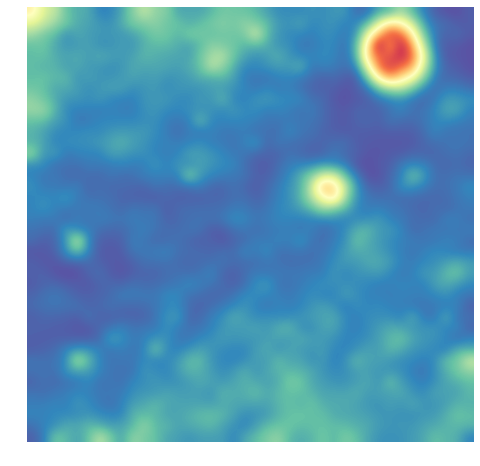

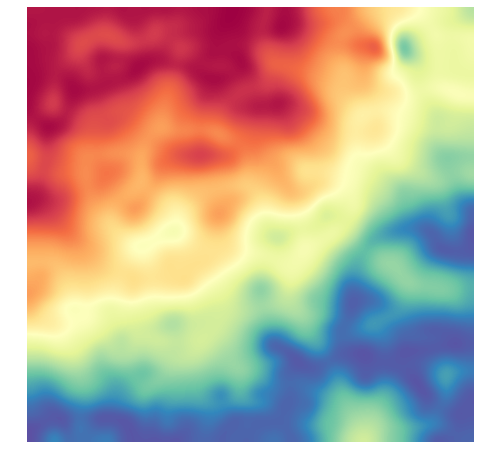

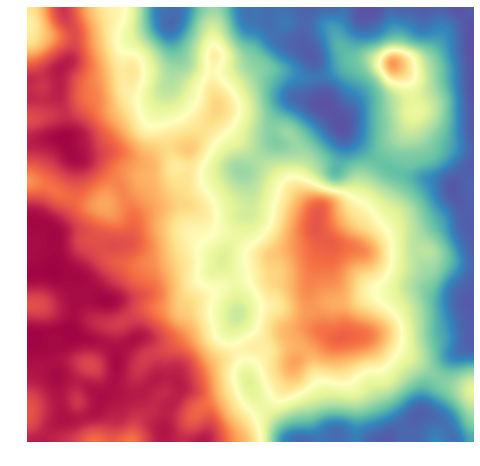

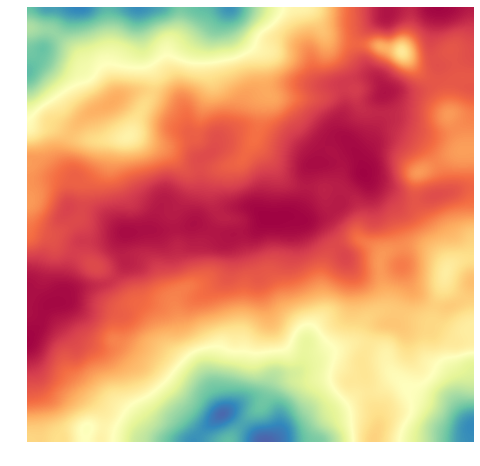

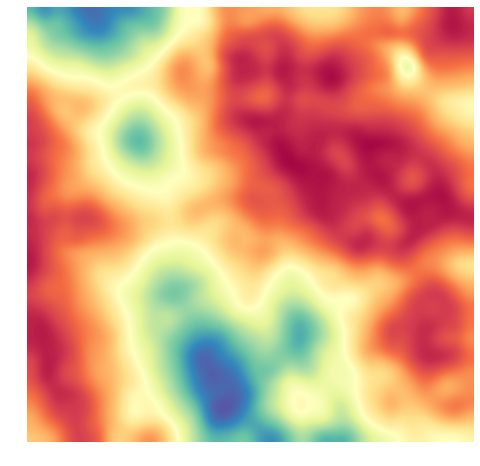

...

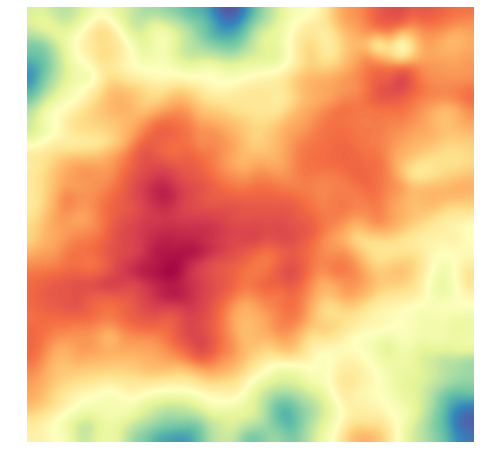

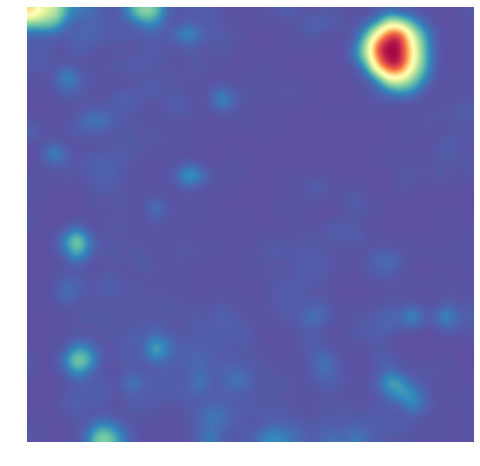

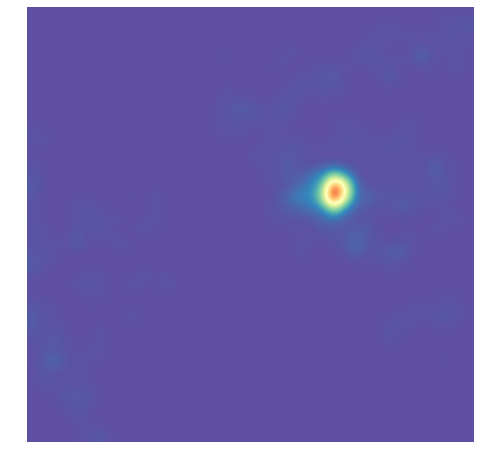

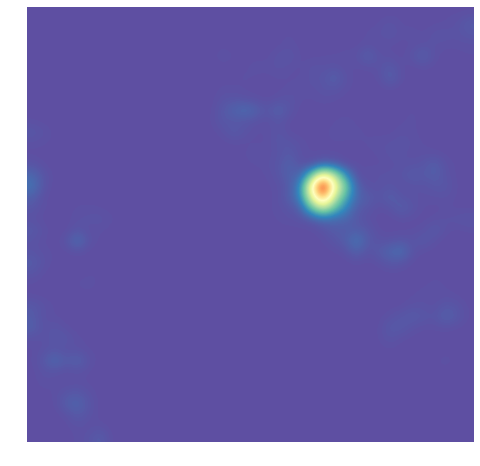

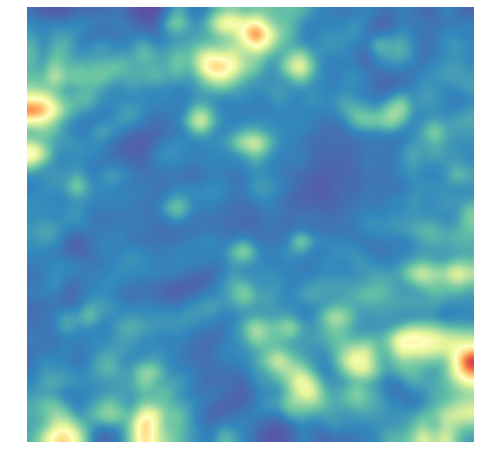

<module 'matplotlib.pyplot' from '/home/valyay/.local/lib/python3.5/site-packages/matplotlib/pyplot.py'>

In [8]:
som.view_umatrix()
som.view_component_planes()

In [0]:
%time som.train(epochs=10000,radius0=1,radiusN=0.000001,radiuscooling="exponential",scale0=0.035, scaleN=0.001, scalecooling="exponential")
e_t = calculate_topographical_error(som, n_rows, n_columns)
print("The topographical error obtained is: %s"%e_t)

CPU times: user 23h 18min 59s, sys: 45 s, total: 23h 19min 44s
Wall time: 5h 54min 32s
The topographical error obtained is: 0.5041118747765285


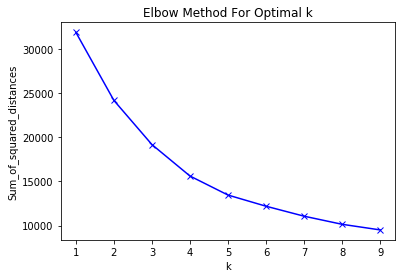

In [9]:
elbow_plot(X)

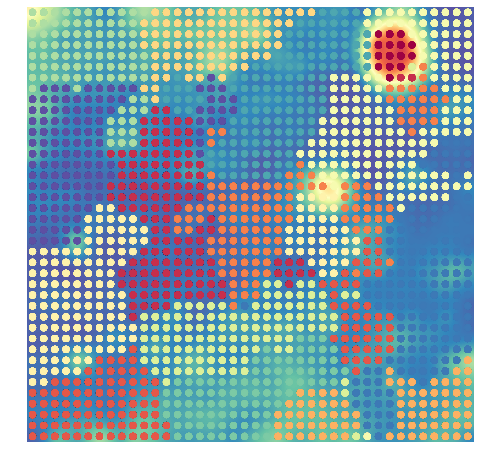

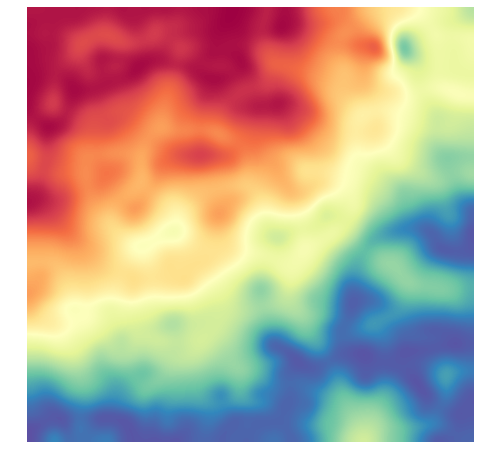

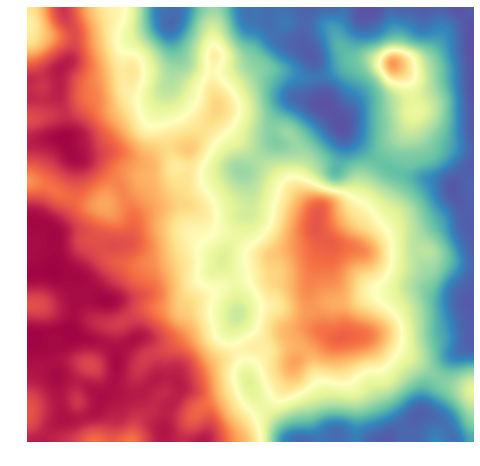

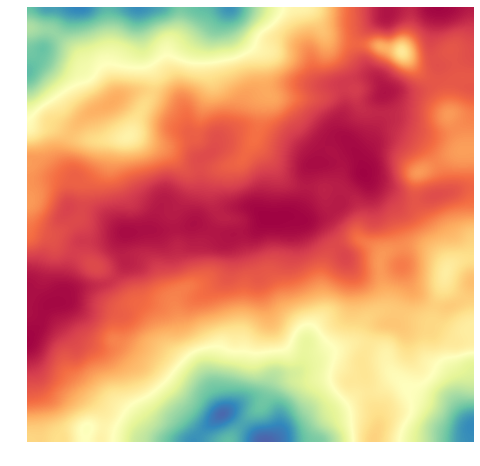

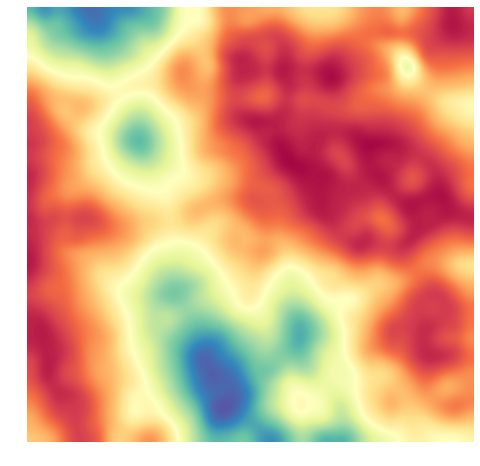

...

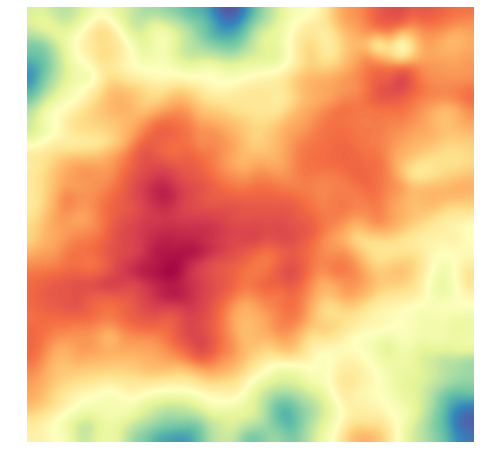

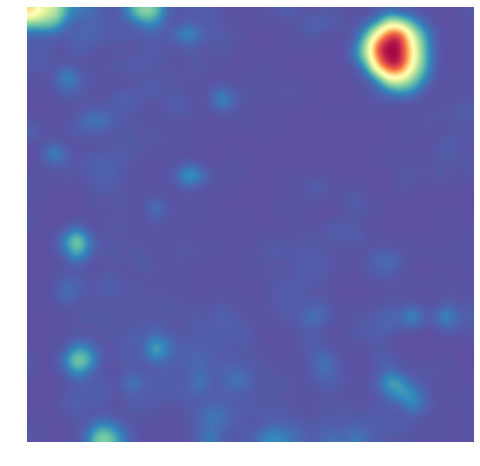

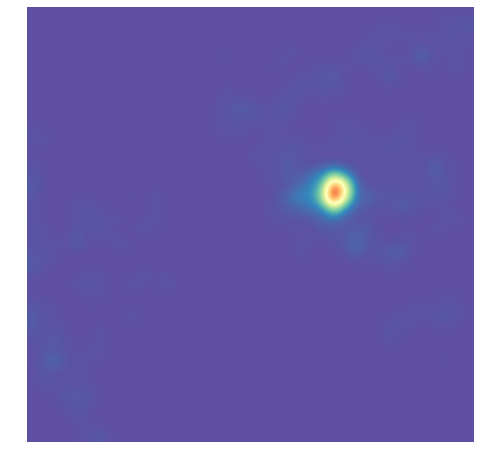

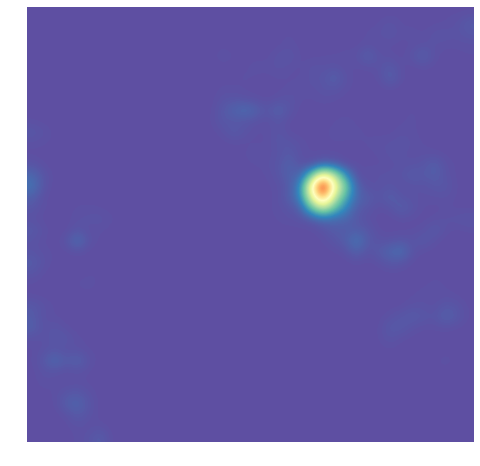

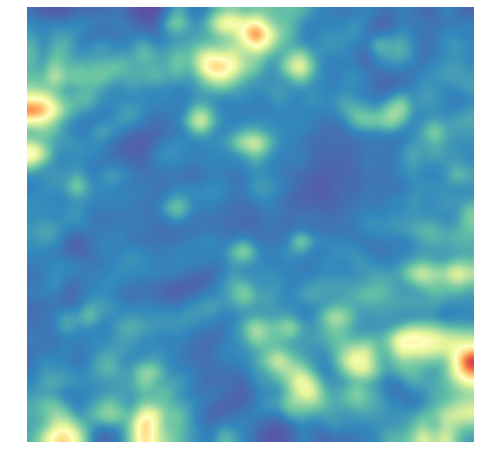

(<module 'matplotlib.pyplot' from '/home/valyay/.local/lib/python3.5/site-packages/matplotlib/pyplot.py'>,
 <module 'matplotlib.pyplot' from '/home/valyay/.local/lib/python3.5/site-packages/matplotlib/pyplot.py'>)

In [16]:
algorithm = KMeans(n_clusters = 14)
som.cluster(algorithm=algorithm)
draw_umatrix()

In [20]:
# We find own data-points for each clusters
clusters = find_clusters(labels)

{
    "0": [
        3342,
        3596,
        3615,
        3616,
        3640,
        3641,
        3666,
        3855,
        3951,
        3952,
        3953,
        3954,
        3955,
        3956,
        3957,
        4064,
        4065,
        4066,
        4086,
        4087,
        4134,
        4135,
        4136,
        4137,
        4138,
        4139,
        4141,
        4142,
        4154,
        4155,
        4156,
        4157,
        4158,
        4159,
        4160,
        4161,
        4162,
        4163,
        4164,
        4168,
        4173,
        4174,
        4175,
        4176,
        4177,
        4178,
        4179,
        4180,
        4181,
        4182,
        4183,
        4184,
        4185,
        4186,
        4187,
        4188,
        4189,
        4190,
        4201,
        4202,
        4203,
        4204,
        4205,
        4206,
        4207,
        4227,
        4228,
        4229,
        4230,
        4319,
       

In [21]:
# calling DataFrame for all clusters
for i in range(len(clusters)):
    print("Cluster: {}".format(i))
    cluster_frame = cluster_data_frame(str(i), clusters)
#     print(cluster_frame, "\n"*10)
    print(cluster_frame.describe(), '\n'*10)

Cluster: 0
                day          hour          DEWP          HUMI          PRES  \
count  14819.000000  14819.000000  14819.000000  14819.000000  14819.000000   
mean     329.200756     12.473784     -3.615055     54.854625   1023.534631   
std       25.918263      6.281216      9.542167     21.807167      5.883775   
min      231.000000      0.000000    -33.000000      4.000000   1005.000000   
25%      312.000000      8.000000    -11.000000     38.000000   1019.000000   
50%      335.000000     13.000000     -3.000000     56.000000   1024.000000   
75%      350.000000     18.000000      4.000000     71.270000   1028.000000   
max      364.000000     23.000000     17.000000    100.000000   1042.000000   

               TEMP           Iws  precipitation         Iprec    average_PM  
count  14819.000000  14819.000000   14819.000000  14819.000000  14819.000000  
mean       6.036035     28.625345       0.293549      0.090647     87.621668  
std        9.168689     57.338988       

In [24]:
specific_cluster0 = cluster_data('0', clusters)
specific_cluster1 = cluster_data('1', clusters)
specific_cluster2 = cluster_data('2', clusters)
specific_cluster1_frame = cluster_data_frame('1', clusters)
specific_cluster4 = cluster_data('4', clusters)

Quantity strings in clusters - 14819 
 Approximate map size - 24.671168910136224 
Quantity strings in clusters - 25045 
 Approximate map size - 28.129710407731864 
Quantity strings in clusters - 27954 
 Approximate map size - 28.91318881731253 
Quantity strings in clusters - 17226 
 Approximate map size - 25.617167790894072 


In [26]:
n_rows, n_columns = 28, 28
X = data_transformation(specific_cluster1_frame)
labels = range(X.shape[0])
som = somoclu.Somoclu(n_columns, n_rows, data=X, maptype="toroid", initialization="pca")
%time som.train(epochs=1000,radius0=27, radiusN=1,radiuscooling="exponential",scale0=0.1, scaleN=0.035, scalecooling="exponential")

/home/valyay/.local/lib/python3.5/site-packages/sklearn/preprocessing/data.py:334: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


(25045, 10)
CPU times: user 21min 14s, sys: 1.18 s, total: 21min 15s
Wall time: 5min 34s


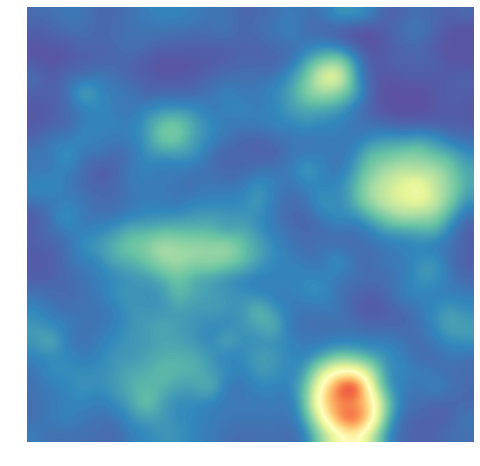

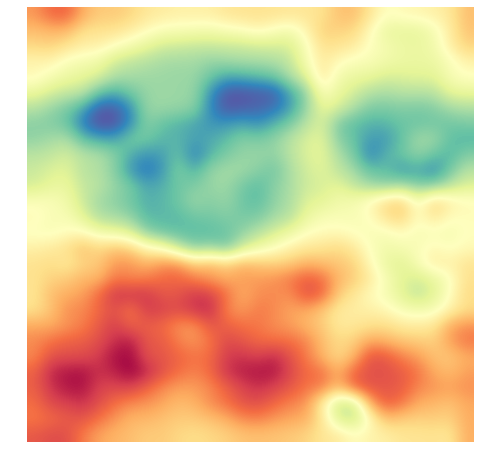

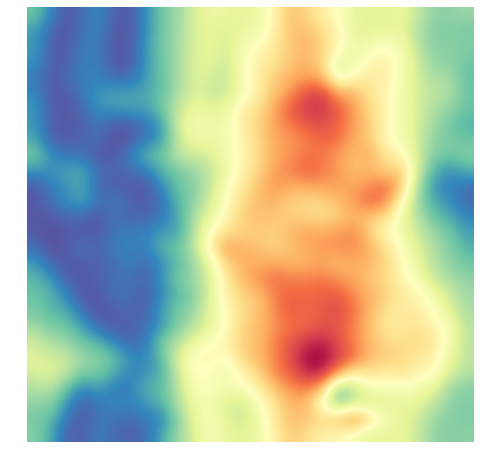

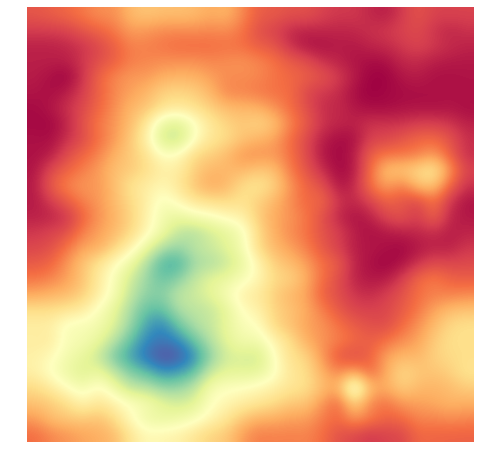

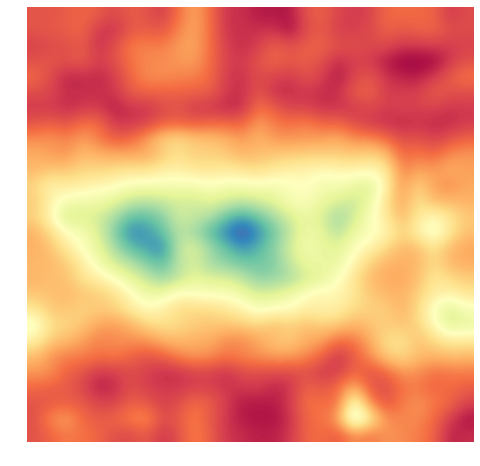

...

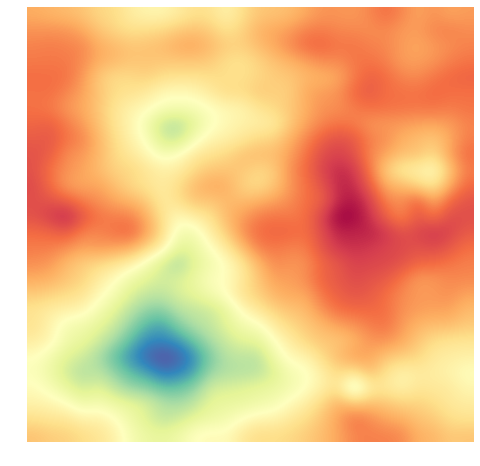

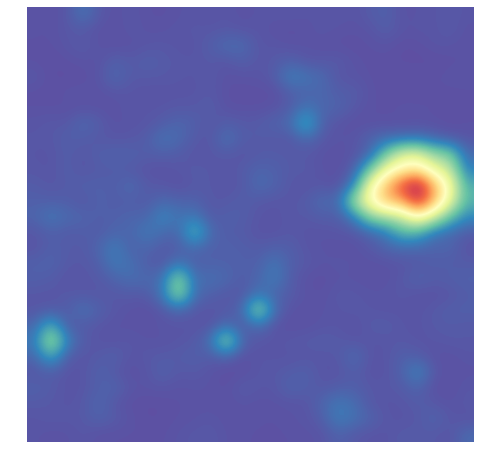

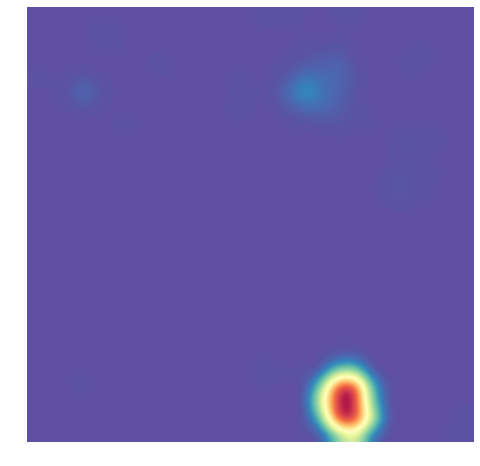

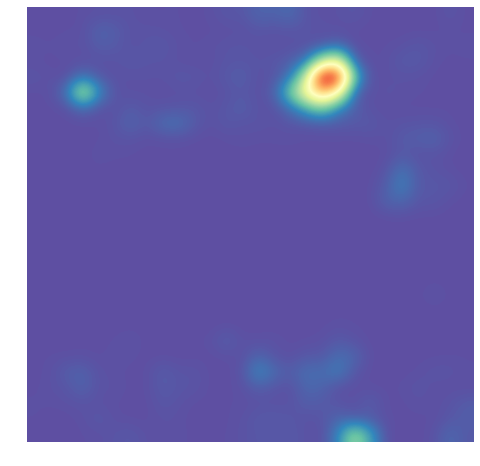

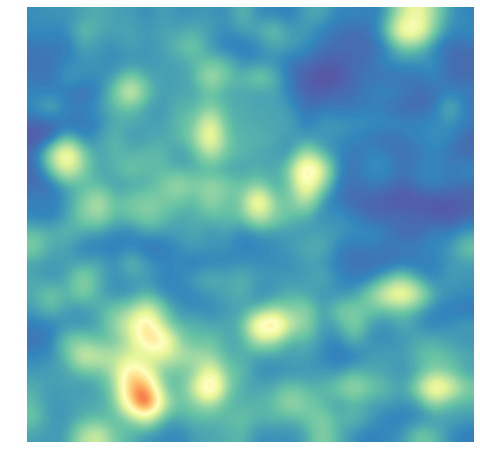

<module 'matplotlib.pyplot' from '/home/valyay/.local/lib/python3.5/site-packages/matplotlib/pyplot.py'>

In [27]:
som.view_umatrix()
som.view_component_planes()

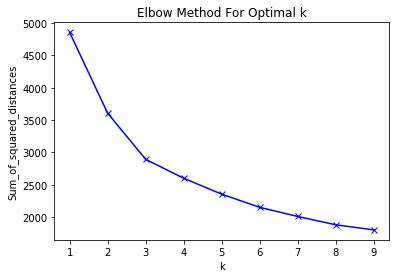

In [28]:
elbow_plot(X)

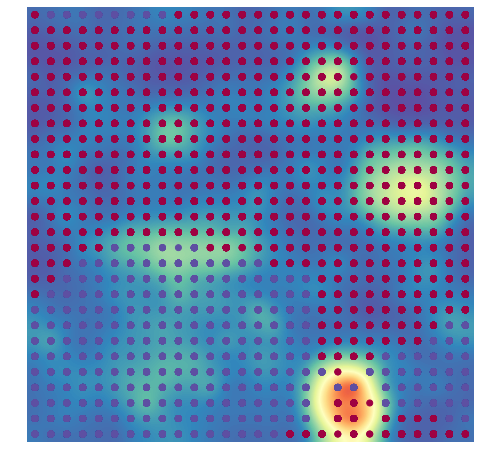

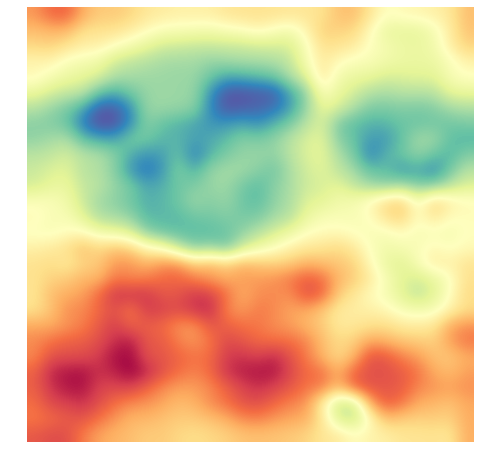

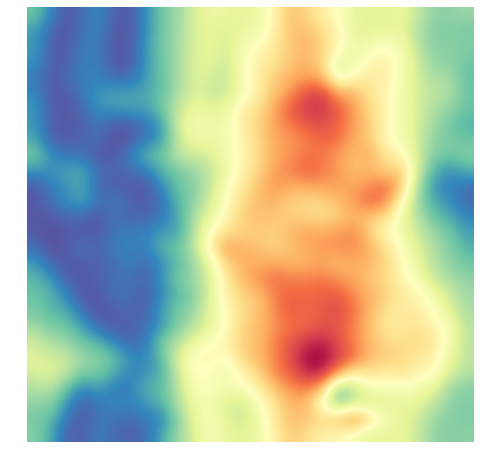

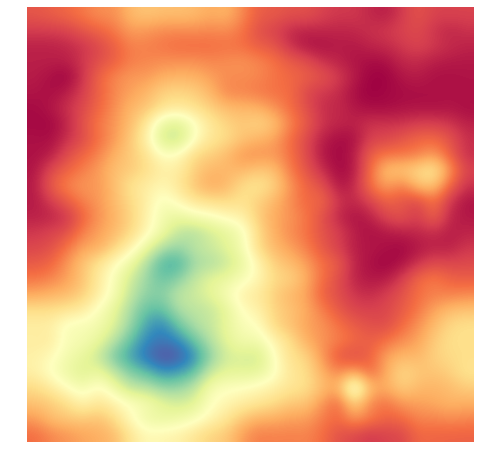

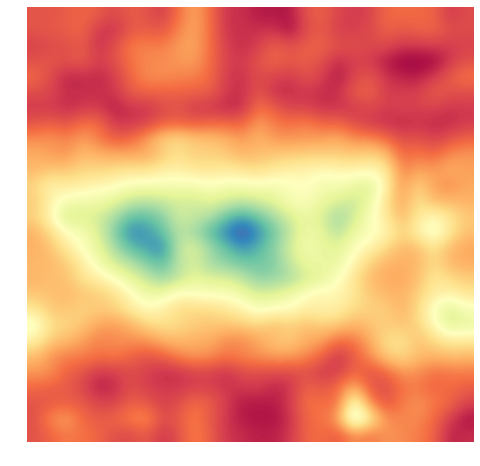

...

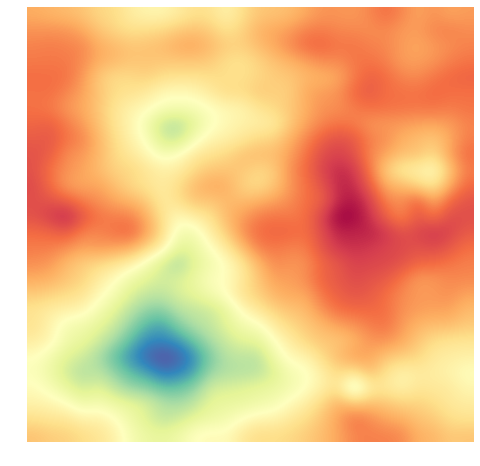

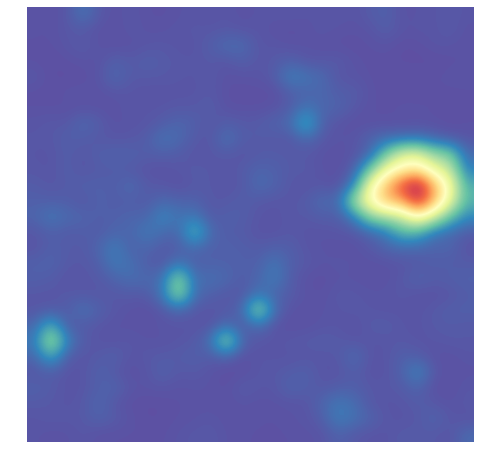

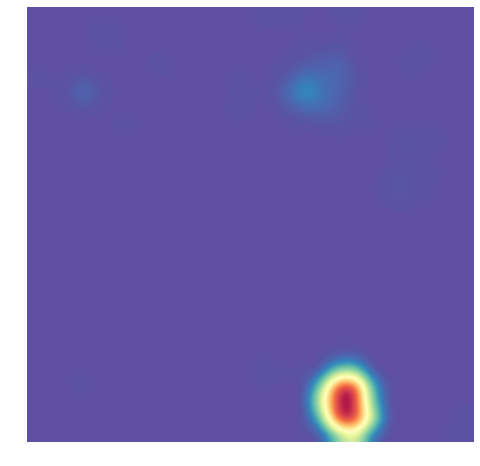

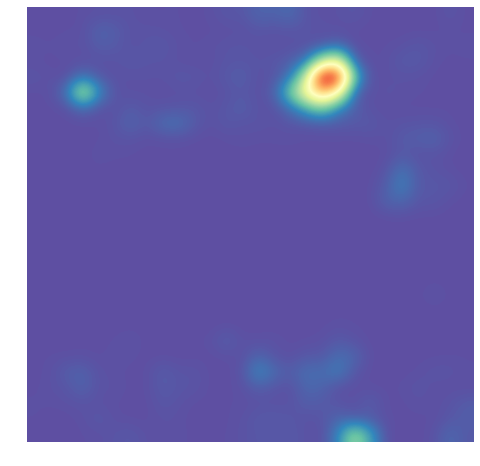

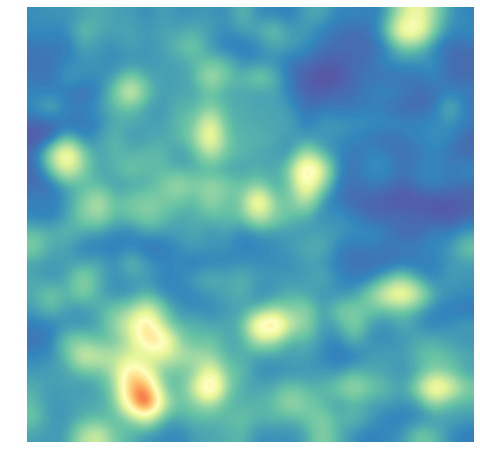

(<module 'matplotlib.pyplot' from '/home/valyay/.local/lib/python3.5/site-packages/matplotlib/pyplot.py'>,
 <module 'matplotlib.pyplot' from '/home/valyay/.local/lib/python3.5/site-packages/matplotlib/pyplot.py'>)

In [33]:
algorithm = KMeans(n_clusters = 2)
som.cluster(algorithm=algorithm)
draw_umatrix()

In [24]:
import jdc
import numpy as np
import itertools 


class SOM(object):
    
    
    def __init__(self,h,w,dim_feat):
        """
            Construction of a zero-filled SOM.
            h,w,dim_feat: constructs a (h,w,dim_feat) SOM.
        """
        self.shape = (h,w,dim_feat)
        self.som = np.zeros((h,w,dim_feat))

        # Training parameters
        self.L0 = 0.0
        self.lam = 0.0
        self.sigma0 = 0.0
    
    
    def train(self,data,L0,lam,sigma0,initializer=np.random.rand):
        """ 
            Training procedure for a SOM.
            data: a N*d matrix, N the number of examples, 
                  d the same as dim_feat=self.shape[2].
            L0,lam,sigma0: training parameters.
            initializer: a function taking h,w and dim_feat (*self.shape) as 
                         parameters and returning an initial (h,w,dim_feat) tensor.
        """
        self.L0 = L0
        self.lam = lam
        self.sigma0 = sigma0
        self.data = data
        self.som = initializer(*self.shape)
        bmu_list = []
        
        for t in itertools.count():
            if self.sigma(t) < 0.5:
                break
            i_data =  np.random.choice(range(len(data)))

            bmu = self.find_bmu(data[i_data])
            self.update_som(bmu,data[i_data],t)
            # check out
            bmu_list.append(bmu)
        return bmu_list
            
    
    def find_bmu(self, input_vec):
        """
            Find the BMU of a given input vector.
            input_vec: a d=dim_feat=self.shape[2] input vector.
        """
        list_bmu = []
        for y in range(self.shape[0]):
            for x in range(self.shape[1]):
                dist = np.linalg.norm((input_vec-self.som[y,x]))
                list_bmu.append(((y,x),dist))
        list_bmu.sort(key=lambda x: x[1])
        return list_bmu[0][0]
    
    
    def update_bmu(self,bmu,input_vector,t):
        """
            Update rule for the BMU.
            bmu: (y,x) BMU's coordinates.
            input_vector: current data vector.
            t: current time.
        """
        self.som[bmu] += self.L(t)*(input_vector-self.som[bmu])

        
    def L(self, t):
        """
            Learning rate formula.
            t: current time.
        """
        return self.L0*np.exp(-t/self.lam) 

    
    
    def update_som(self,bmu,input_vector,t):
        """ 
            Calls the update rule on each cell.
            bmu: (y,x) BMU's coordinates.
            input_vector: current data vector.
            t: current time.
        """
        for y in range(self.shape[0]):
            for x in range(self.shape[1]):
                dist_to_bmu = np.linalg.norm((np.array(bmu)-np.array((y,x))))
                self.update_cell((y,x),dist_to_bmu,input_vector,t)

                
    def update_cell(self,cell,dist_to_bmu,input_vector,t):
        """ 
            Computes the update rule on a cell.
            cell: (y,x) cell's coordinates.
            dist_to_bmu: L2 distance from cell to bmu.
            input_vector: current data vector.
            t: current time.
        """
        self.som[cell] += self.N(dist_to_bmu,t)*self.L(t)*(input_vector-self.som[cell])
        # My attempts
#         self.new_som.append(self.som[cell])

        
    def N(self,dist_to_bmu,t):
        """ 
            Computes the neighbouring penalty.
            dist_to_bmu: L2 distance to bmu.
            t: current time.
        """
        curr_sigma = self.sigma(t)
        return np.exp(-(dist_to_bmu**2)/(2*curr_sigma**2))

    
    def sigma(self, t):
        """
            Neighbouring radius formula.
            t: current time.
        """
        return self.sigma0*np.exp(-t/self.lam)
    
    
    def quantization_error(self):
        """ 
            Computes the quantization error of the SOM.
            It uses the data fed at last training.
        """
        bmu_dists = []
        for input_vector in self.data:
            bmu = self.find_bmu(input_vector)
            bmu_feat = self.som[bmu]
            bmu_dists.append(np.linalg.norm(input_vector-bmu_feat))
        return np.array(bmu_dists).mean()

In [ ]:
som_square = SOM(29,29, 13)
train_som = som_square.train(specific_cluster,L0=0.8,lam=1e2,sigma0=10)
bmu = train_som
mapp = som_square.som

In [0]:
%time som.train(epochs=10000,radius0=1,radiusN=0.000001,radiuscooling="exponential",scale0=0.035, scaleN=0.001, scalecooling="exponential")
e_t = calculate_topographical_error(som, n_rows, n_columns)
print("The topographical error obtained is: %s"%e_t)

CPU times: user 2h 22min 41s, sys: 10.5 s, total: 2h 22min 52s
Wall time: 38min 37s
The topographical error obtained is: 0.5026902847469923


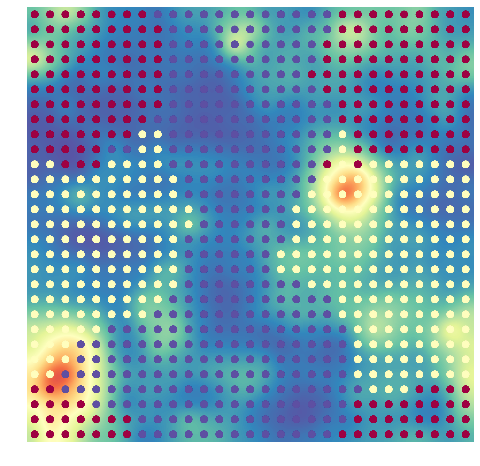

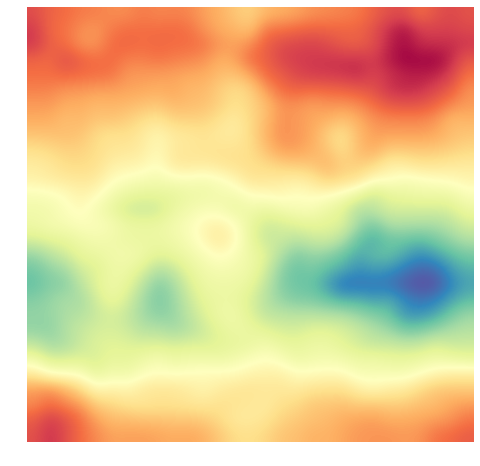

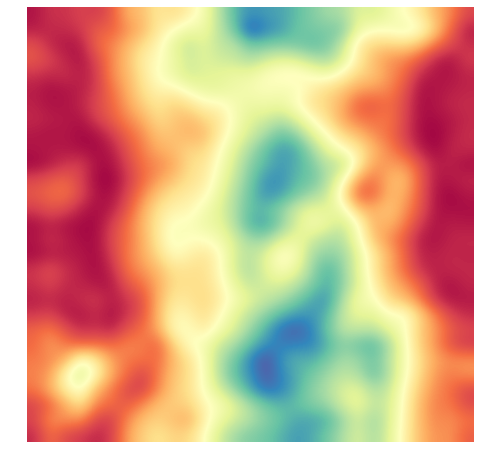

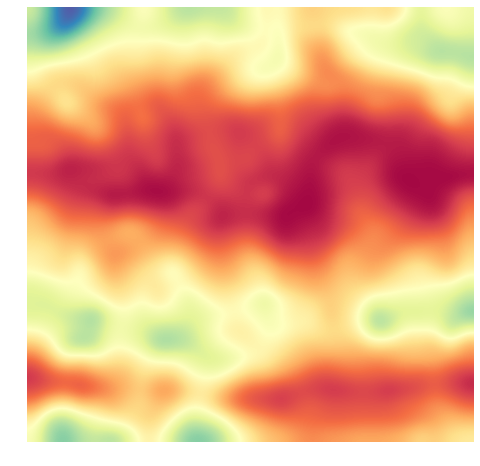

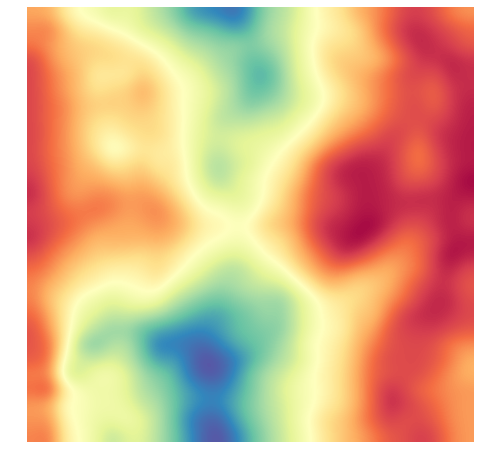

...

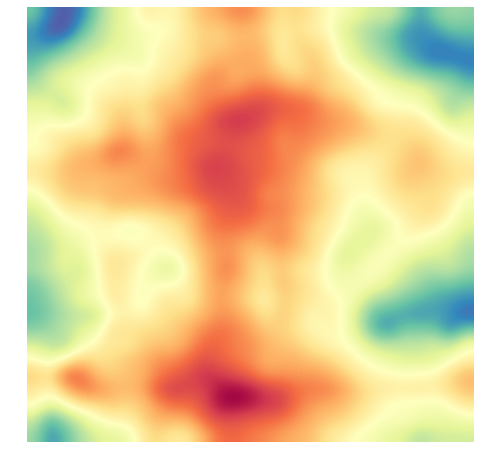

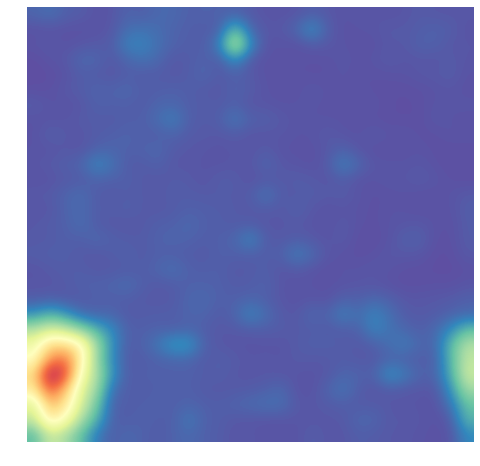

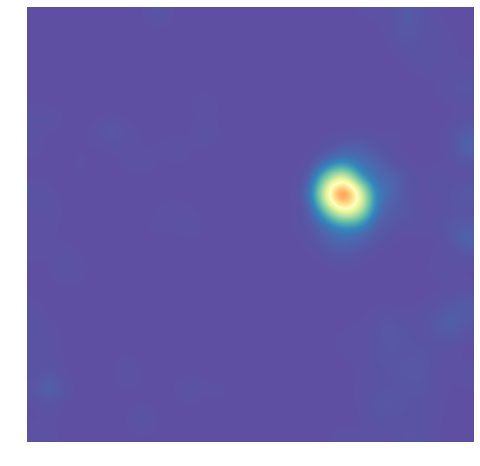

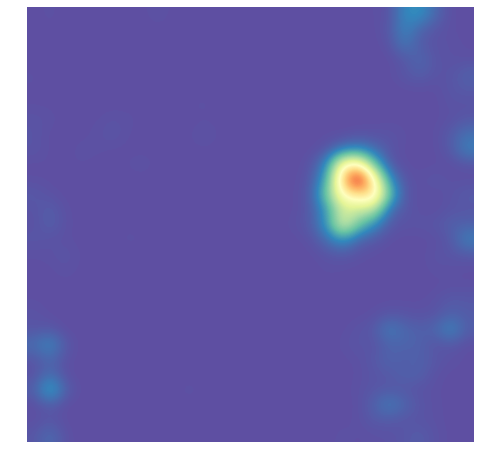

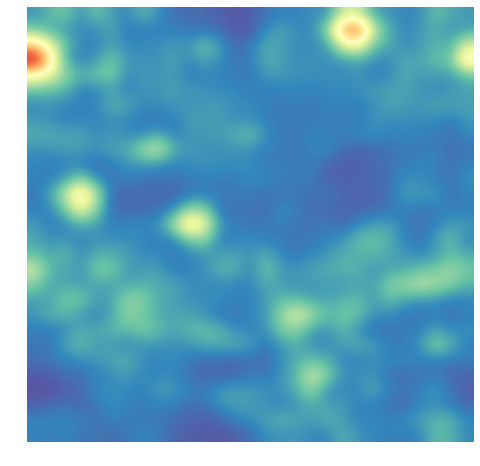

(<module 'matplotlib.pyplot' from '/home/valyay/.local/lib/python3.5/site-packages/matplotlib/pyplot.py'>,
 <module 'matplotlib.pyplot' from '/home/valyay/.local/lib/python3.5/site-packages/matplotlib/pyplot.py'>)

In [28]:
algorithm = KMeans(n_clusters = 3)
som.cluster(algorithm=algorithm)
draw_umatrix()

In [32]:
clusters = find_clusters(range(specific_cluster3.shape[0]))

{
    "0": [
        12,
        13,
        14,
        17,
        18,
        19,
        34,
        35,
        36,
        37,
        46,
        47,
        48,
        49,
        50,
        51,
        52,
        53,
        54,
        55,
        61,
        62,
        63,
        64,
        65,
        66,
        67,
        71,
        72,
        73,
        74,
        75,
        79,
        80,
        85,
        89,
        90,
        91,
        92,
        93,
        94,
        98,
        99,
        101,
        102,
        111,
        112,
        113,
        114,
        115,
        116,
        117,
        118,
        119,
        123,
        124,
        125,
        126,
        127,
        128,
        129,
        130,
        131,
        132,
        133,
        134,
        135,
        136,
        140,
        141,
        142,
        143,
        147,
        148,
        149,
        150,
        156,
        157,
        158,
   

In [33]:
# calling DataFrame for all clusters
for i in range(len(clusters)):
    print("Cluster: {}".format(i))
    cluster_frame = cluster_data_frame(str(i), clusters)
#     print(cluster_frame, "\n"*10)
    print(cluster_frame.describe(), '\n'*10)

Cluster: 0
                day          hour          DEWP          HUMI          PRES  \
count  11330.000000  11330.000000  11330.000000  11330.000000  11330.000000   
mean     170.398147     11.646867      4.217387     57.109725   1015.866637   
std      107.357093      6.955035     12.638002     25.773156      9.438894   
min        0.000000      0.000000    -38.000000      2.000000    991.000000   
25%       81.000000      6.000000     -4.000000     35.000000   1008.250000   
50%      149.000000     12.000000      5.000000     60.390000   1016.000000   
75%      268.000000     18.000000     15.000000     80.000000   1023.000000   
max      364.000000     23.000000     28.000000    100.000000   1040.000000   

               TEMP           Iws  precipitation         Iprec    average_PM  
count  11330.000000  11330.000000   11330.000000  11330.000000  11330.000000  
mean      14.318094     15.933871       0.059682      0.321430     94.907296  
std       10.081510     38.588676       

In [34]:
specific_cluster1 = cluster_data('1', clusters)

Quantity strings in clusters - 8981 
 Approximate map size - 21.767882086412204 


In [42]:
print(specific_cluster1)

[[0.17582418 0.34782609 0.5        ... 0.         0.         0.13833442]
 [0.17582418 0.39130435 0.47058824 ... 0.         0.         0.14766034]
 [0.17582418 0.43478261 0.47058824 ... 0.         0.         0.1483966 ]
 ...
 [0.32142857 0.69565217 0.70588235 ... 0.         0.         0.04221204]
 [0.32692308 0.82608696 0.76470588 ... 0.         0.         0.03370419]
 [0.32692308 0.86956522 0.76470588 ... 0.         0.         0.04352094]]


In [35]:
n_rows, n_columns = 21, 21
som = somoclu.Somoclu(n_columns, n_rows, data=specific_cluster1, maptype="toroid", initialization="pca")
%time som.train(epochs=1000,radius0=20, radiusN=1,radiuscooling="exponential",scale0=0.1, scaleN=0.035, scalecooling="exponential")

CPU times: user 4min 28s, sys: 449 ms, total: 4min 29s
Wall time: 1min 21s


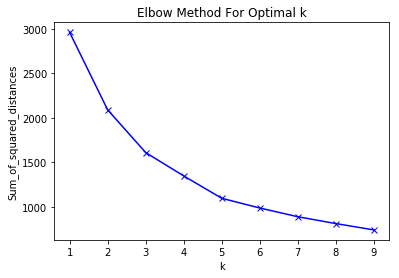

In [36]:
elbow_plot(specific_cluster1)

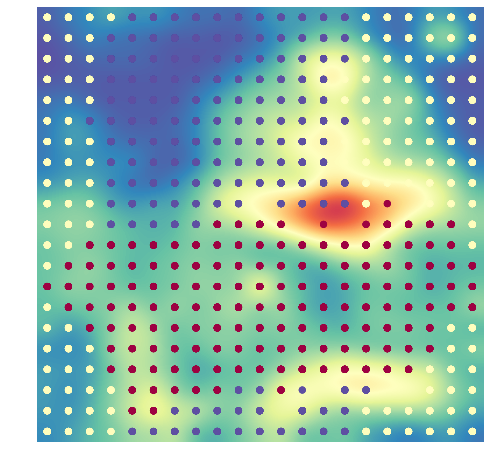

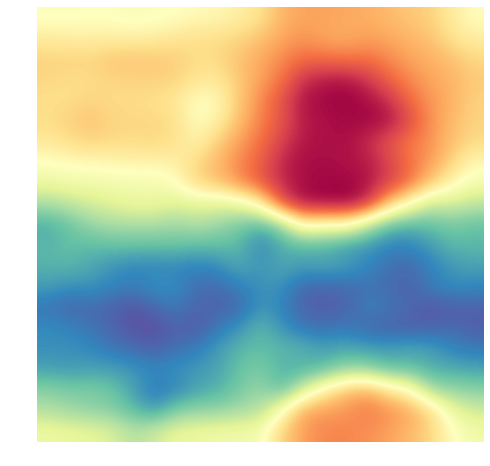

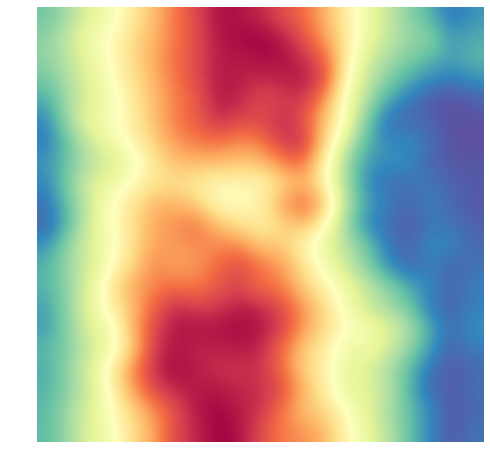

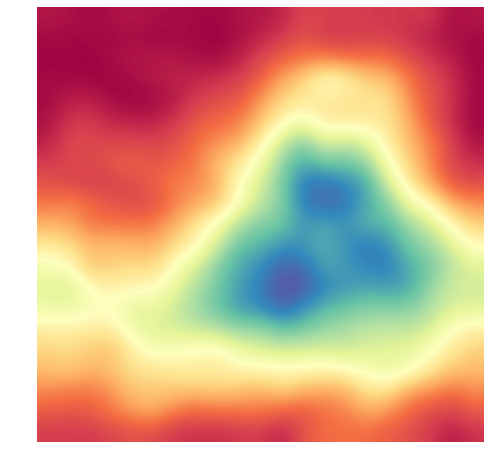

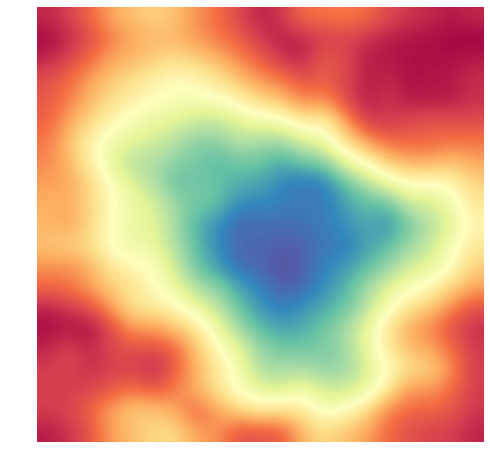

...

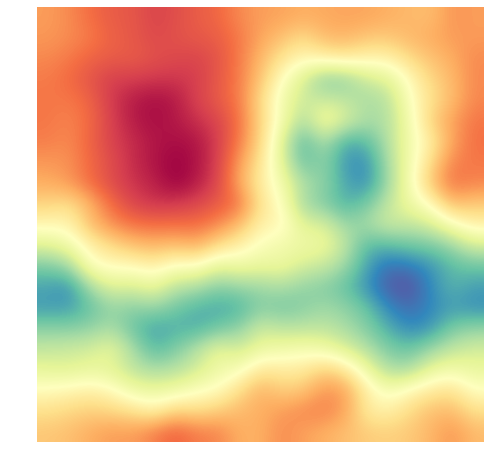

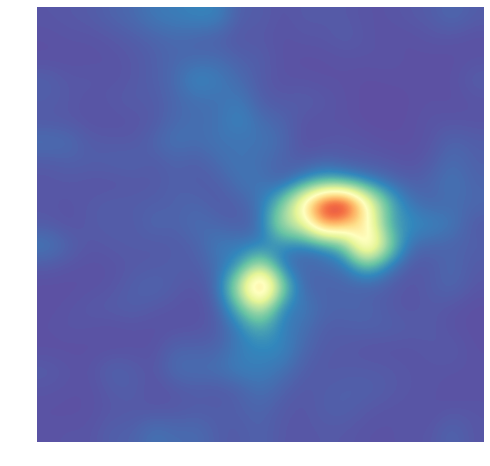

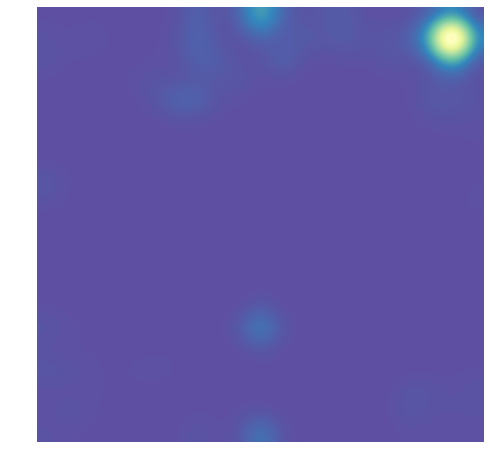

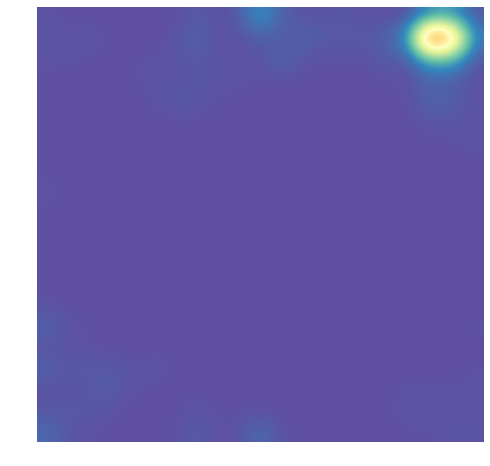

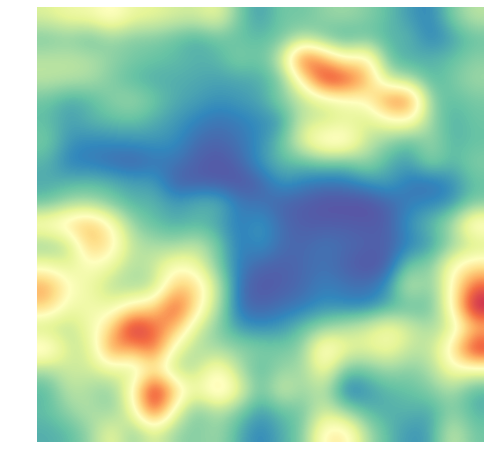

(<module 'matplotlib.pyplot' from '/home/valyay/.local/lib/python3.5/site-packages/matplotlib/pyplot.py'>,
 <module 'matplotlib.pyplot' from '/home/valyay/.local/lib/python3.5/site-packages/matplotlib/pyplot.py'>)

In [37]:
algorithm = KMeans(n_clusters = 3)
som.cluster(algorithm=algorithm)
draw_umatrix()

In [39]:
clusters = find_clusters(range(specific_cluster1.shape[0]))

{
    "0": [
        357,
        358,
        359,
        360,
        372,
        373,
        374,
        382,
        383,
        386,
        387,
        388,
        389,
        390,
        407,
        408,
        409,
        410,
        411,
        412,
        413,
        414,
        415,
        416,
        420,
        421,
        422,
        423,
        424,
        425,
        426,
        427,
        431,
        434,
        435,
        436,
        437,
        438,
        439,
        448,
        449,
        450,
        451,
        452,
        457,
        458,
        459,
        460,
        461,
        462,
        463,
        464,
        465,
        466,
        467,
        468,
        469,
        473,
        474,
        475,
        476,
        477,
        478,
        479,
        482,
        483,
        484,
        485,
        486,
        491,
        492,
        493,
        494,
        495,
        499,
        500,

In [40]:
# calling DataFrame for all clusters
for i in range(len(clusters)):
    print("Cluster: {}".format(i))
    cluster_frame = cluster_data_frame(str(i), clusters)
#     print(cluster_frame, "\n"*10)
    print(cluster_frame.describe(), '\n'*10)

Cluster: 0
               day         hour         DEWP         HUMI         PRES  \
count  3173.000000  3173.000000  3173.000000  3173.000000  3173.000000   
mean    153.138355    11.132997     1.988969    51.126536  1014.881500   
std      93.109351     6.979520    14.831298    25.683214    10.498926   
min       0.000000     0.000000   -39.000000     2.000000   991.000000   
25%      80.000000     5.000000    -9.000000    28.000000  1007.000000   
50%     126.000000    11.000000     2.000000    53.000000  1014.000000   
75%     229.000000    17.000000    16.000000    74.000000  1023.000000   
max     364.000000    23.000000    26.000000   100.000000  1039.000000   

              TEMP          Iws  precipitation        Iprec   average_PM  
count  3173.000000  3173.000000    3173.000000  3173.000000  3173.000000  
mean     13.890009    20.039121       0.061551     0.272361    92.246691  
std      11.465484    40.429096       0.700637     2.581044    80.895810  
min     -12.000000    

In [0]:
labels = range(specific_cluster.shape[0])
clusters = find_clusters(labels)
quantization = quant_err(specific_cluster)
print(quantization)

{
    "0": [
        2570,
        2571,
        2572,
        2573,
        2574,
        2575,
        2576,
        2577,
        2578,
        2579,
        2580,
        2581,
        2582,
        2583,
        2584,
        2585,
        2586,
        2587,
        2588,
        2589,
        2590,
        2591,
        2592,
        2593,
        2594,
        2595,
        2596,
        2597,
        2598,
        2599,
        2600,
        2601,
        2602,
        2603,
        2604,
        2605,
        2606,
        2607,
        2608,
        2609,
        2610,
        2611,
        2612,
        2613,
        2614,
        2615,
        2616,
        2617,
        2618,
        2619,
        2620,
        2621,
        2622,
        2623,
        2624,
        2625,
        2626,
        2627,
        2628,
        2629,
        2630,
        2631,
        2632,
        2633,
        2634,
        2635,
        2636,
        2637,
        2638,
        2639,
       

0.9042089794236504


In [0]:
som_square = SOM(40,40, 13)
train_som = som_square.train(X,L0=0.8,lam=1e2,sigma0=10)
bmu = train_som
mapp = som_square.som

In [0]:
print(mapp.quantization_error())

AttributeError: 'numpy.ndarray' object has no attribute 'quantization_error'

In [0]:
print(som_square.quantization_error())

0.4055960377532623


In [0]:
print(som_square.quantization_error())

0.29963716197197615


In [0]:
som_square = SOM(40,40, 13)
train_som = som_square.train(specific_cluster,L0=0.8,lam=1e2,sigma0=10)
bmu = train_som
mapp = som_square.som
print(som_square.quantization_error())

0.2820734871115981
